In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import seaborn as sns
sns.set_context("paper")
sns.set_style("ticks")

# Uncomment the next two lines if running for the book
import warnings
warnings.filterwarnings("ignore")

from functools import partial
import jax
from jax import lax, tree, vmap, jit
import jax.random as jr
import jax.numpy as jnp
from jax.flatten_util import ravel_pytree
import equinox as eqx
import numpyro
import numpyro.distributions as dist
import numpyro.handlers
from numpyro.infer.util import initialize_model
import optax
import pandas as pd

jax.config.update("jax_enable_x64", True)
key = jr.PRNGKey(0)
pprint = eqx.tree_pprint

# Population uncertainty

## Cars on a bumpy road

There is a bump on the road that causes cars to oscillate after hitting it.
The nature of the oscillation depends on the car's mass and suspension system.
You've installed a camera on the highway that can capture snapshots of each car's *vertical displacement*.
You capture 20 snapshots per car before they drive out of the camera's view.
**Suppose you want to infer the cars' suspension dynamics parameters (with uncertainty).**

First, we need a **forward model for the vertical displacement $x$ of a car**. 
We'll model this as a damped harmonic oscillator

$$
\begin{equation*}
    \begin{aligned}
        &\ddot{x} + 2\zeta\dot{x} + \omega^2 x = 0 \\
        &x(0) = x_0 \\
        &\dot{x}(0) = 0
    \end{aligned}
\end{equation*}
$$

where $\zeta$ is the damping ratio and $\omega$ is the natural frequency.
Let $x(t; x_0, \zeta, \omega)$ be the vertical position of a car at time $t$, which is obtained by solving the above ordinary differential equation (ODE).

This ODE happens to have an analytic solution.
Let's code it up and visualize:

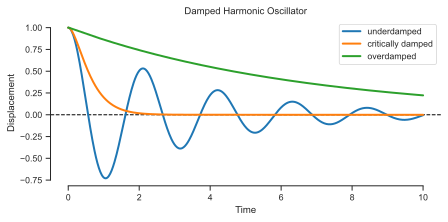

In [2]:
@jit
def damped_harmonic_oscillator(t, x0, v0, zeta, omega):
    """
    Computes the displacement x(t) of a damped harmonic oscillator.
    
    Parameters
    ----------
        t: Time (scalar or array).
        x0: Initial displacement.
        v0: Initial velocity.
        omega: Natural frequency (rad/s).
        zeta: Damping ratio.

    Returns:
        x: Displacement x(t) at time t.
    """
    kwargs = dict(x0=x0, v0=v0, omega=omega)
    index = jnp.where(zeta < 1.0, 0, jnp.where(jnp.isclose(zeta, 1.0), 1, 2))
    x = lax.switch(
        index,
        [partial(underdamped_solution, zeta=zeta, **kwargs), partial(critically_damped_solution, **kwargs), partial(overdamped_solution, zeta=zeta, **kwargs)],
        t
    )
    return x

def underdamped_solution(t, x0, v0, zeta, omega):
    omega_d = omega * jnp.sqrt(1 - zeta**2)  # Damped natural frequency
    A = x0
    B = (v0 + zeta * omega * x0) / omega_d  # From initial velocity
    x = jnp.exp(-zeta * omega * t) * (A * jnp.cos(omega_d * t) + B * jnp.sin(omega_d * t))
    return x

def critically_damped_solution(t, x0, v0, omega):
    A = x0
    B = v0 + omega * x0
    x = (A + B * t) * jnp.exp(-omega * t)
    return x

def overdamped_solution(t, x0, v0, zeta, omega):
    r1 = -omega * (zeta - jnp.sqrt(zeta**2 - 1))
    r2 = -omega * (zeta + jnp.sqrt(zeta**2 - 1))
    A = (v0 - r2 * x0) / (r1 - r2)
    B = (r1 * x0 - v0) / (r1 - r2)
    x = A * jnp.exp(r1 * t) + B * jnp.exp(r2 * t)
    return x

# Parameters
x0 = 1.0       # Initial displacement
v0 = 0.0       # Initial velocity
omega = 3.0  # Natural frequency (rad/s)
zetas = [0.1, 1.0, 10.0]  # Damping ratio

# Time array
t = jnp.linspace(0, 10, 500)

# Compute displacement and velocity
xs = [damped_harmonic_oscillator(t, x0, v0, zeta_i, omega) for zeta_i in zetas]
x_underdamped, x_critically_damped, x_overdamped = xs

fig, ax = plt.subplots(figsize=(7, 3))
ax.plot(t, x_underdamped, lw=2, label='underdamped')
ax.plot(t, x_critically_damped, lw=2, label='critically damped')
ax.plot(t, x_overdamped, lw=2, label='overdamped')
ax.axhline(0, color="black", lw=1, ls='--', zorder=-10)
ax.set_ylabel("Displacement")
ax.set_xlabel("Time")
ax.set_title("Damped Harmonic Oscillator")
ax.legend()
sns.despine(trim=True)

## Hierarchical probabilistic model

### Population distribution

We want to answer the following question: ***For a random car, what is the prior distribution over its suspension dynamics parameters (i.e., damping ratio $\zeta$ and natural frequency $\omega$)?***

In this context, the prior distribution is often called the *population distribution*. We write it as 

$$
\underbrace{p(\zeta, \omega)}_{\substack{\text{population} \\ \text{distribution}}} = \int \underbrace{p(\zeta, \omega | \theta_\text{pop})}_{\substack{\text{conditional} \\ \text{prior}}} \underbrace{p(\theta_\text{pop})}_{\substack{\text{prior on} \\ \text{population} \\ \text{parameters}}} d\theta_\text{pop}
$$ 

where $\theta_\text{pop}$ are the *population parameters*.
Let the conditional prior be defined with

$$
\log \zeta | \mu_\zeta, \tau_\zeta \sim \text{Normal}(\mu_\zeta, \tau_\zeta^2) \\
\log \omega | \mu_\omega, \tau_\omega \sim \text{Normal}(\mu_\omega, \tau_\omega^2)
$$

where $\mu_\zeta$ and $\tau_\zeta$ are the population mean and standard deviation for $\log \zeta$ (and similarly for $\omega$).
The population parameters are then just 

$$
\theta_\text{pop}=(\mu_\zeta, \tau_\zeta, \mu_\omega, \tau_\omega).
$$

Let's define the prior on these population parameters with

$$
\begin{align*}
    \mu_\zeta &\sim \text{Normal}(-1, 1) \\
    \tau_\zeta &\sim \text{Exponential}(10) \\
    \mu_\omega &\sim \text{Normal}(0, 0.5) \\
    \tau_\omega &\sim \text{Exponential}(10)
\end{align*}
$$

This is the directed acyclic graph (DAG) associated with our model so far:

![Hierarchical model for suspension dynamics](dag1.png)

### Connecting the population distribution to the data

Suppose we observe 30 cars driving over the same bump. 
Let's assume the initial displacement $x_0$ is the same for all cars, and that it is between 0 and 5 inches:

$$
x_0 \sim \text{Uniform}([0, 5])
$$

Finally, let the observed displacement of car $i$ at time $j$ be

$$
y_{ij}| t_{ij}, \zeta_i, \omega_i, x_0 \sim \text{Normal}\Big(x(t_{ij}; x_0, \zeta_i, \omega_i), \sigma^2 \Big)
$$

where the measurement noise $\sigma$ is known.
Here is the DAG for the full hierarchical model:

![Hierarchical model for suspension dynamics](dag2.png)

We can write down the posterior as

$$
\begin{align*}
p(\underbrace{\theta_\text{pop}, \zeta, \omega, x_0}_\text{unknowns}| \underbrace{\mathbf{t}, \mathbf{y}}_\text{data})
\propto \left[ \prod_{i=1}^{30} \left[ \prod_{j=1}^M 
\underbrace{p(y_{ij}|t_{ij}, \zeta_i, \omega_i, x_0, \sigma^2)}_\text{likelihood of an observation} \right] 
\underbrace{p(\zeta_i|\mu_\zeta, \tau_\zeta) ~ p(\omega_i|\mu_\omega, \tau_\omega)}_\text{conditional priors} 
\right] ~ \underbrace{p(\mu_\zeta) ~ p(\tau_\zeta) ~ p(\mu_\omega) ~ p(\tau_\omega)}_{\substack{\text{prior on} \\ \text{population parameters}}} 
\underbrace{p(x_0)}_{\substack{\text{initial condition} \\ \text{prior}}}
\end{align*}
$$

where $\zeta = (\zeta_1, \dots, \zeta_{30})$ and $\omega = (\omega_1, \dots, \omega_{30})$ are the sets of physical parameters for all 30 cars in the dataset.
Finally, we'll transform all random variables to a single random vector $\xi$ which lives in unconstrained space $\mathbb{R}^d$.

## Building the model with Numpyro

We will use Numpyro to construct both the **log probability density** $p(\xi|\mathbf{t}, \mathbf{y})$ and the **transformation** $\xi \mapsto (\theta_\text{pop}, \zeta, \omega, x_0)$.
First, let's write the model using Numpyro objects:

In [3]:
N_TIMES = 20
N_INDIVIDUALS = 30
MEASUREMENT_NOISE = 0.1
times = jnp.linspace(0, 4, N_TIMES)

def model(obs, gamma, prior_only=False):
    # Population parameters
    mu_zeta = numpyro.sample("mu_zeta", dist.Normal(-2.0, 1.0))
    tau_zeta = numpyro.sample("tau_zeta", dist.Exponential(10.0))
    mu_omega = numpyro.sample("mu_omega", dist.Normal(0.0, 0.5))
    tau_omega = numpyro.sample("tau_omega", dist.Exponential(10.0))

    # Initial condition
    x0 = numpyro.sample("x0", dist.Uniform(0, 5))

    # Physical parameters
    with numpyro.plate("individuals", N_INDIVIDUALS):
        log_zeta = numpyro.sample("log_zeta", dist.Normal(mu_zeta, tau_zeta))
        log_omega = numpyro.sample("log_omega", dist.Normal(mu_omega, tau_omega))
        zeta = jnp.exp(log_zeta)
        omega = jnp.exp(log_omega)

        if not prior_only:
            # Solve the ODE
            solver = lambda zeta, omega: damped_harmonic_oscillator(t=times, x0=x0, v0=0.0, zeta=zeta, omega=omega)
            x = vmap(solver, out_axes=-1)(zeta, omega)

            # Observations
            with numpyro.plate("observations", N_TIMES):
                with numpyro.handlers.scale(scale=gamma):
                    y = numpyro.sample("y", dist.Normal(x, MEASUREMENT_NOISE), obs=obs)
    
    return locals()  # Returns a dict of all locally-defined variables

You can check that there are no syntax errors by sampling the model:

In [4]:
# NOTE: This code cell is not needed - it is just useful for checking syntax/value errors in the model definition above.
#       Basically, we want this cell NOT to throw an error.

# The following `with` block applies an "effect handler". 
# It tells Numpyro do a certain task behind the scenes. 
# In this case, we are telling Numpyro to set the random seed to 1.
# Only statements inside the `with` block will be affected.
# Numpyro will throw an error if we do `model(...)` without applying the seed effect handler.
with numpyro.handlers.seed(rng_seed=1):

    # You can sample the hierarchical model defined above by simply calling `model(...)`.
    dummy_y_obs = jnp.ones((N_TIMES, N_INDIVIDUALS))
    samples = model(dummy_y_obs, 1.0)

# Pretty-print the output
eqx.tree_pprint(samples)

{
  'obs': f64[20,30],
  'gamma': 1.0,
  'prior_only': False,
  'mu_zeta': f64[],
  'tau_zeta': f64[],
  'mu_omega': f64[],
  'tau_omega': f64[],
  'log_zeta': f64[30],
  'log_omega': f64[30],
  'zeta': f64[30],
  'omega': f64[30],
  'solver': <function <lambda>>,
  'x': f64[20,30],
  'y': f64[20,30],
  'x0': f64[]
}


Okay, looks like there's no syntax errors.
Let's generate a synthetic dataset using the model we just defined:

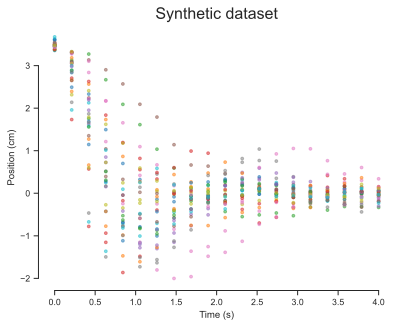

In [5]:
# This cell generates a synthetic dataset for this toy problem.

# These will override the `numpyro.sample` statements in `model`
ground_truth = {
    "x0": jnp.array([3.5]), 
    "mu_zeta": jnp.array([-1.0]),
    "tau_zeta": jnp.array([0.5]),
    "mu_omega": jnp.array([1.0]),
    "tau_omega": jnp.array([0.4])
}
key, subkey = jr.split(key)
simulated_ground_truth = numpyro.infer.Predictive(model, ground_truth)(subkey, None, 1.0)
y_obs = simulated_ground_truth['y'].squeeze(0)

fig, ax = plt.subplots()
for i in range(N_INDIVIDUALS):
    ax.scatter(times, y_obs[:, i], 8, alpha=0.5, lw=1)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Position (cm)")
ax.set_title("Synthetic dataset", fontsize=16)
sns.despine(trim=True)

Next, let's get the probablility density and transformation functions from Numpyro (we're following the procedure in the [blackjax documentation](https://blackjax-devs.github.io/blackjax/examples/howto_use_numpyro.html)):

In [6]:
key, subkey = jr.split(key)
(
    init_params,  # We don't need this
    potential_fn_gen, 
    postprocess_fn_gen, 
    model_trace  # We also don't need this
) = initialize_model(
    subkey,
    model,
    model_args=(y_obs, 1.0, False),  # Dummy arguments
    dynamic_args=True,
)

# Get the probability density.
# This is p(ξ|y,t)
joint_log_prob_tempered = lambda x, gamma: -potential_fn_gen(y_obs, gamma, False)(x)
joint_log_prob = lambda x: joint_log_prob_tempered(x, 1.0)

# Get the transformation function.
# This is ξ ↦ (θ_pop, ζ, ω, x0)
transform = lambda x: postprocess_fn_gen(y_obs, 1.0)(x)

We now have everything we need from Numpyro in order to do sampling with Blackjax!
To demonstrate, here is how to evaluate $p(\xi|\mathbf{t}, \mathbf{y})$ at some point $\xi$:

In [7]:
# Create a dummy ξ
xi = {
    'mu_zeta': jnp.ones(()),
    'tau_zeta': jnp.ones(()),
    'mu_omega': jnp.ones(()),
    'tau_omega': jnp.ones(()),
    'log_zeta': jnp.ones((N_INDIVIDUALS,)),
    'log_omega': jnp.ones((N_INDIVIDUALS,)),
    'x0': jnp.ones(()),
}

joint_log_prob(xi)

Array(-72293.6990451, dtype=float64)

And here is how to transform `xi` back to the original parameter ranges:

In [8]:
transform(xi)

{'mu_zeta': Array(1., dtype=float64),
 'tau_zeta': Array(2.71828183, dtype=float64),
 'mu_omega': Array(1., dtype=float64),
 'tau_omega': Array(2.71828183, dtype=float64),
 'log_zeta': Array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float64),
 'log_omega': Array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=float64),
 'x0': Array(3.65529289, dtype=float64)}

NOTE: If you're not sure what structure `xi` should have, you can print `init_params.z`, which is a default value of `xi` generated by Numpyro.

## Sampling the hierarchical model posterior

Let's set up the No-U-Turn Sampler (NUTS) with Blackjax for this problem.
First, let's pick starting points for each sampling chain:

In [9]:
NUM_CHAINS = 3

# Helper function for initializing a chain
get_initial_xi = lambda key: tree.map(lambda x: jr.normal(key, x.shape), xi)

# Initialize the chains
key, subkey = jr.split(key)
keys = jr.split(subkey, NUM_CHAINS)
initial_xis = vmap(get_initial_xi)(keys)

# Print the shapes of `initial_xis`
eqx.tree_pprint(initial_xis)

{
  'log_omega': f64[3,30],
  'log_zeta': f64[3,30],
  'mu_omega': f64[3],
  'mu_zeta': f64[3],
  'tau_omega': f64[3],
  'tau_zeta': f64[3],
  'x0': f64[3]
}


Next, let's define the inference loop (modified from [this Blackjax tutorial](https://blackjax-devs.github.io/sampling-book/models/change_of_variable_hmc.html)):

In [10]:
import blackjax

def inference_loop_multiple_chains(
    key, 
    initial_states, 
    sampler_params, 
    log_prob_fn, 
    num_samples, 
    num_chains, 
    annealing_schedule
):
    kernel = blackjax.nuts.build_kernel()

    def step_fn(key, state, gamma, **params):
        return kernel(key, state, lambda x: log_prob_fn(x, gamma), **params)

    def one_step(states, fixed):
        key, gamma = fixed
        keys = jr.split(key, num_chains)
        states, infos = jax.vmap(partial(step_fn, gamma=gamma, **sampler_params))(keys, states)
        return states, (states, infos)

    keys = jr.split(key, num_samples)
    gammas = annealing_schedule(jnp.arange(num_samples))
    fixed = (keys, gammas)
    _, (states, infos) = lax.scan(one_step, initial_states, fixed)

    return (states, infos)

To make the posterior sampling more robust, we'll use annealing to gradually transition from sampling the prior to sampling the posterior during the warmup phase.
To this end, we need to define an annealing schedule:

In [11]:
def create_continuous_schedule(init_value, end_value, constant_steps, cosine_steps):
    """Creates a continuous schedule that joins constant -> cosine -> constant.
    
    Args:
        init_value: Initial value during first constant phase
        peak_value: Peak value at end of cosine phase
        end_value: Final value during last constant phase
        constant_steps: Number of steps for first constant phase
        cosine_steps: Number of steps for cosine phase
        total_steps: Total number of steps
    """
    # First constant schedule
    constant1 = optax.constant_schedule(init_value)
    
    # Cosine schedule that goes from init_value to peak_value
    cosine = optax.cosine_decay_schedule(
        init_value=init_value,
        decay_steps=cosine_steps,
        alpha=end_value/init_value  # Ensures continuity with final constant
    )
    
    # Final constant schedule
    constant2 = optax.constant_schedule(end_value)
    
    # Join the schedules at the boundaries
    return optax.join_schedules(
        schedules=[constant1, cosine, constant2],
        boundaries=[constant_steps, constant_steps + cosine_steps]
    )

In [12]:
# Define the annealing schedule
annealing_schedule = create_continuous_schedule(
    init_value=0.1,
    end_value=1.0,
    constant_steps=200,
    cosine_steps=600
)

Finally, let's run the sampler:

In [13]:
# NUTS parameters
nuts_params = {
    'step_size': 0.001,
    'inverse_mass_matrix': jnp.ones(len(ravel_pytree(xi)[0]))
}

# Initialize the NUTS sampler states
nuts = blackjax.nuts(joint_log_prob, **nuts_params)
initial_states = vmap(nuts.init)(initial_xis)

In [14]:
# Split the key for warmup and sampling
key, warmup_key, sample_key = jr.split(key, 3)

# Warmup
num_warmup = 1000
warmup_states, warmup_infos = inference_loop_multiple_chains(
    warmup_key, initial_states, nuts_params, joint_log_prob_tempered, num_warmup, NUM_CHAINS, annealing_schedule
)

# Sample
num_samples = 1000
last_warmup_states = tree.map(lambda x: x[-1], warmup_states)
states, infos = inference_loop_multiple_chains(
    sample_key, last_warmup_states, nuts_params, joint_log_prob_tempered, num_samples, NUM_CHAINS, lambda x: jnp.ones_like(x)
)

# Put the samples in a dictionary of arrays with shape (NUM_CHAINS, NUM_INDIVIDUALS, ...)
xi_samples = {k: v.swapaxes(0, 1) for k, v in states.position.items()}

Here are the posterior sample histograms and trace plots:

In [15]:
# Visualize the posterior samples
import arviz as az
samples_dataset = az.from_dict(xi_samples)
az.plot_trace(samples_dataset, backend_kwargs={'tight_layout': True});

Compute R-hat to check MCMC convergence (should be close to 1):

In [16]:
az.rhat(samples_dataset)

<xarray.Dataset> Size: 1kB
Dimensions:          (log_omega_dim_0: 30, log_zeta_dim_0: 30)
Coordinates:
  * log_omega_dim_0  (log_omega_dim_0) int64 240B 0 1 2 3 4 5 ... 25 26 27 28 29
  * log_zeta_dim_0   (log_zeta_dim_0) int64 240B 0 1 2 3 4 5 ... 25 26 27 28 29
Data variables:
    log_omega        (log_omega_dim_0) float64 240B 1.001 1.001 ... 1.006 1.665
    log_zeta         (log_zeta_dim_0) float64 240B 1.001 1.001 ... 1.007 1.662
    mu_omega         float64 8B 1.031
    mu_zeta          float64 8B 1.038
    tau_omega        float64 8B 1.516
    tau_zeta         float64 8B 1.387
    x0               float64 8B 1.002

And let's plot the epistemic and aleatoric uncertainty in the cars' vertical position (as a function of time):

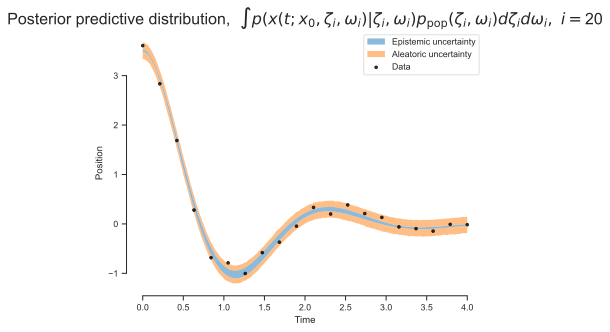

In [17]:
# Concatenate the chains
# `xi_samples` is a dict of arrays with shape (num_chains, num_samples, ...)
# `xi_samples_combined` is a dict of arrays with shape (num_chains * num_samples, ...)
xi_samples_combined = tree.map(lambda x: x.reshape(x.shape[0] * x.shape[1], *x.shape[2:]), xi_samples)

# Transform the samples to the original parameter ranges
samples = vmap(transform)(xi_samples_combined)

# Pick a dataset to plot
data_idx = 20
t_i, y_obs_i = times, y_obs[:, data_idx]

# Extract the samples for the chosen dataset
zeta_samples = jnp.exp(samples['log_zeta'][:, data_idx])
omega_samples = jnp.exp(samples['log_omega'][:, data_idx])
x0_samples = samples['x0']

# Propagate samples through the ODE
t_plt = jnp.linspace(0, 4.0, 200)
solver = lambda zeta, omega, x0: damped_harmonic_oscillator(t=t_plt, x0=x0, v0=0.0, zeta=zeta, omega=omega)
x_samples = vmap(solver)(zeta_samples, omega_samples, x0_samples)

# Simulate measurements
y_samples = x_samples + jr.normal(key, shape=x_samples.shape)*MEASUREMENT_NOISE

# Compute statistics
x05, x95 = jnp.quantile(x_samples, q=jnp.array([0.05, 0.95]), axis=0)
y05, y95 = jnp.quantile(y_samples, q=jnp.array([0.05, 0.95]), axis=0)

fig, ax = plt.subplots()
ax.fill_between(t_plt, x05, x95, color='tab:blue', lw=0, alpha=0.5, label=r'Epistemic uncertainty')
ax.fill_between(t_plt, y05, x05, color='tab:orange', lw=0, alpha=0.5, label=r'Aleatoric uncertainty')
ax.fill_between(t_plt, x95, y95, color='tab:orange', lw=0, alpha=0.5)
ax.scatter(times, y_obs_i, s=8, alpha=0.8, color='k', label=f"Data", zorder=10)
ax.set_title(r"Posterior predictive distribution, $~\int p(x(t; x_0, \zeta_i, \omega_i)| \zeta_i, \omega_i) p_\text{pop}(\zeta_i, \omega_i) d\zeta_i d\omega_i, ~i=$" + f"{data_idx}", fontsize=16)
ax.set_xlabel("Time")
ax.set_ylabel("Position")
ax.legend()
sns.despine(trim=True);

## Sampling the population distribution

We can also visualize the population distribution $p_\text{pop}(\zeta, \omega)$ by sampling from it:

In [18]:
# Get the samples for the population parameters
mu_zeta = samples['mu_zeta']
tau_zeta = samples['tau_zeta']
mu_omega = samples['mu_omega']
tau_omega = samples['tau_omega']

# Sample the population distribution
key, key_zeta, key_omega = jr.split(key, 3)
log_zeta_pop_samples = dist.Normal(mu_zeta, tau_zeta).rsample(key_zeta)
log_omega_pop_samples = dist.Normal(mu_omega, tau_omega).rsample(key_omega)

# Transform to physical space
zeta_pop_samples = jnp.exp(log_zeta_pop_samples)
omega_pop_samples = jnp.exp(log_omega_pop_samples)

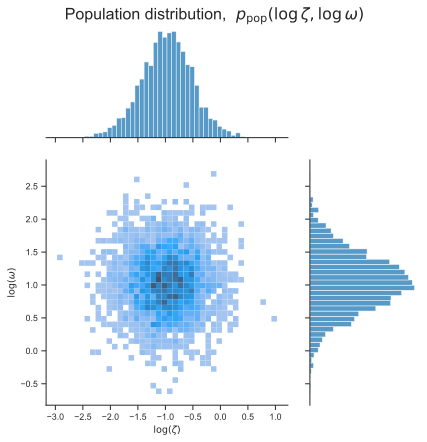

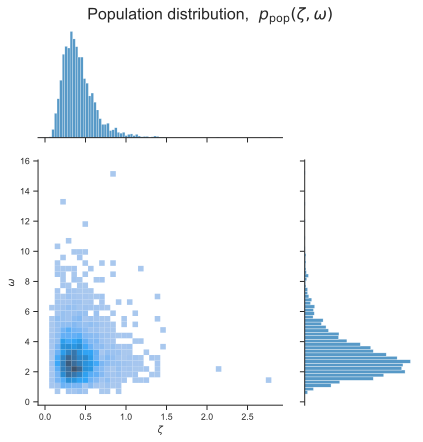

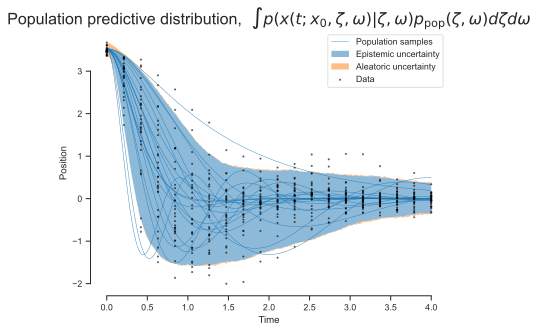

In [19]:
############################################################################################
# Histograms
############################################################################################

_df = pd.DataFrame({r'$\log(\zeta)$': log_zeta_pop_samples, r'$\log(\omega)$': log_omega_pop_samples})
g = sns.jointplot(data=_df, x=r'$\log(\zeta)$', y=r'$\log(\omega)$', kind='hist', fill=True, ratio=2, bins=40)
g.figure.suptitle(r'Population distribution, $~p_\text{pop}(\log\zeta, \log\omega)$', y=1.02, fontsize=16);

_df = pd.DataFrame({r'$\zeta$': zeta_pop_samples, r'$\omega$': omega_pop_samples})
g = sns.jointplot(data=_df, x=r'$\zeta$', y=r'$\omega$', kind='hist', fill=True, ratio=2, bins=40)
g.figure.suptitle(r'Population distribution, $~p_\text{pop}(\zeta, \omega)$', y=1.02, fontsize=16);


############################################################################################
# Time series plot
############################################################################################

# Get the initial condition samples
x0_samples = samples['x0']

# Propagate through the ODE
t_plt = jnp.linspace(0, 4.0, 200)
solver = lambda zeta, omega, x0: damped_harmonic_oscillator(t=t_plt, x0=x0, v0=0.0, zeta=zeta, omega=omega)
x_samples = vmap(solver)(zeta_pop_samples, omega_pop_samples, x0_samples)

# Simulate measurements
y_samples = x_samples + jr.normal(key, shape=x_samples.shape)*MEASUREMENT_NOISE

# Compute statistics
x05, x95 = jnp.quantile(x_samples, q=jnp.array([0.05, 0.95]), axis=0)
y05, y95 = jnp.quantile(y_samples, q=jnp.array([0.05, 0.95]), axis=0)

fig, ax = plt.subplots()
ax.plot(t_plt, x_samples[0], alpha=0.8, lw=0.5, color='tab:blue', label=r'Population samples')
ax.plot(t_plt, x_samples[1:20].T, alpha=0.8, lw=0.5, color='tab:blue')
ax.fill_between(t_plt, x05, x95, color='tab:blue', lw=0, alpha=0.5, label='Epistemic uncertainty')
ax.fill_between(t_plt, y05, x05, color='tab:orange', lw=0, alpha=0.5, label='Aleatoric uncertainty')
ax.fill_between(t_plt, x95, y95, color='tab:orange', lw=0, alpha=0.5)
ax.scatter(times, y_obs[:, 0], s=2, color='k', alpha=0.5, zorder=100, label='Data')
for i in range(1, N_INDIVIDUALS):
    ax.scatter(times, y_obs[:, i], s=2, color='k', alpha=0.5, zorder=100)
ax.set_title(r"Population predictive distribution, $~\int p(x(t; x_0, \zeta, \omega) | \zeta, \omega) p_\text{pop}(\zeta, \omega) d\zeta d\omega$", fontsize=16)
ax.set_xlabel("Time")
ax.set_ylabel("Position")
ax.legend()
sns.despine(trim=True);

The population distribution visually agrees with the data we've collected.

## Population-level predictions

Now, what can we do with this population distribution?
Suppose there is another bump further down the road, and a construction team needs to smooth out the bump if 10% of cars that drive over it reach the threshold vertical displacement of $x=-2$ cm.
We think a-priori that this new bump's height $x^\text{new}_0 \sim \mathcal{N}(5, 1)$ cm, but we don't have a camera installed to monitor cars' positions.
But we can simulate the scenario with our population distribution.

First, let's visualize trajectories (sampled from the population) for our new initial condition:

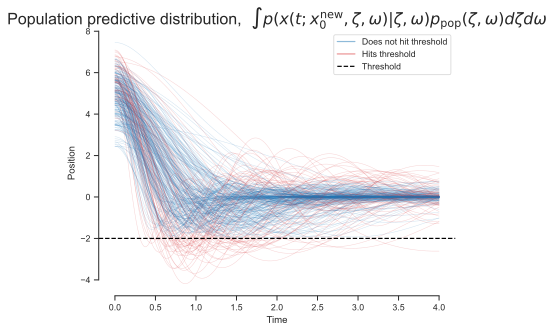

In [20]:
# Get the initial condition samples
key, subkey = jr.split(key)
x0_samples = dist.Normal(5, 1).rsample(subkey, sample_shape=(zeta_pop_samples.shape[0],))

# Propagate through the ODE
t_plt = jnp.linspace(0, 4.0, 200)
solver = lambda zeta, omega, x0: damped_harmonic_oscillator(t=t_plt, x0=x0, v0=0.0, zeta=zeta, omega=omega)
x_samples = vmap(solver)(zeta_pop_samples, omega_pop_samples, x0_samples)

# Simulate measurements
y_samples = x_samples + jr.normal(key, shape=x_samples.shape)*MEASUREMENT_NOISE

# Compute statistics
x05, x95 = jnp.quantile(x_samples, q=jnp.array([0.05, 0.95]), axis=0)
y05, y95 = jnp.quantile(y_samples, q=jnp.array([0.05, 0.95]), axis=0)

# Check which population samples hit the threshold
hits_threshold = jnp.any(x_samples < -2, axis=1)

# Create a colormap based on whether samples hit threshold
colors = ['tab:blue' if not hit else 'tab:red' for hit in hits_threshold]

fig, ax = plt.subplots()
for i in range(300):
    ax.plot(t_plt, x_samples[i], alpha=0.2, lw=0.5, color=colors[i])
ax.plot([], [], color='tab:blue', alpha=0.5, label='Does not hit threshold')  # Dummy plot for legend
ax.plot([], [], color='tab:red', alpha=0.5, label='Hits threshold')  # Dummy plot for legend
ax.axhline(y=-2, color='black', linestyle='--', label='Threshold')
ax.set_title(r"Population predictive distribution, $~\int p(x(t; x^\text{new}_0, \zeta, \omega) | \zeta, \omega) p_\text{pop}(\zeta, \omega) d\zeta d\omega$", fontsize=16)
ax.set_xlabel("Time")
ax.set_ylabel("Position")
ax.legend()
sns.despine(trim=True);

Let's see the distribution of the lowest position for each trajectory, i.e., $\min_{t} \Big\{x(t; x^\text{new}_0, \zeta, \omega)\Big\}$ where $\zeta, \omega \sim p_\text{pop}$:

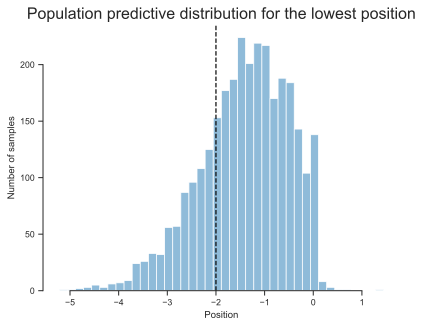

In [21]:
x_min = jnp.min(x_samples, axis=1)

fig, ax = plt.subplots()
ax.hist(x_min, bins=40, color='tab:blue', alpha=0.5)
ax.axvline(x=-2, color='black', linestyle='--', label='Threshold')
ax.set_title("Population predictive distribution for the lowest position", fontsize=16)
ax.set_xlabel("Position")
ax.set_ylabel("Number of samples")
sns.despine(trim=True);


Finally let's compute the probability that a car will hit the threshold of $x=-2$ cm.
If this value is greater than 0.1, we will send a construction team to smooth out the bump.

In [22]:
# Compute the probability that a car will hit the threshold
prob_hit_threshold = jnp.mean(hits_threshold)
print(f"Probability that a car will hit the threshold is {prob_hit_threshold:.2f}.")

Probability that a car will hit the threshold is 0.24.


## Questions

- Use a smaller dataset (set `N_INDIVIDUALS=10`). Do we still get a good approximation of the population distribution?
- Use less time points (set `N_TIMES=8`). Do the MCMC chains all converge to the same posterior distribution? Why or why not?'
- Increase the measurement noise (set `MEASUREMENT_NOISE=0.3`). Do the MCMC chains all converge to the same posterior distribution? Why or why not?'